# 1. Reading an image

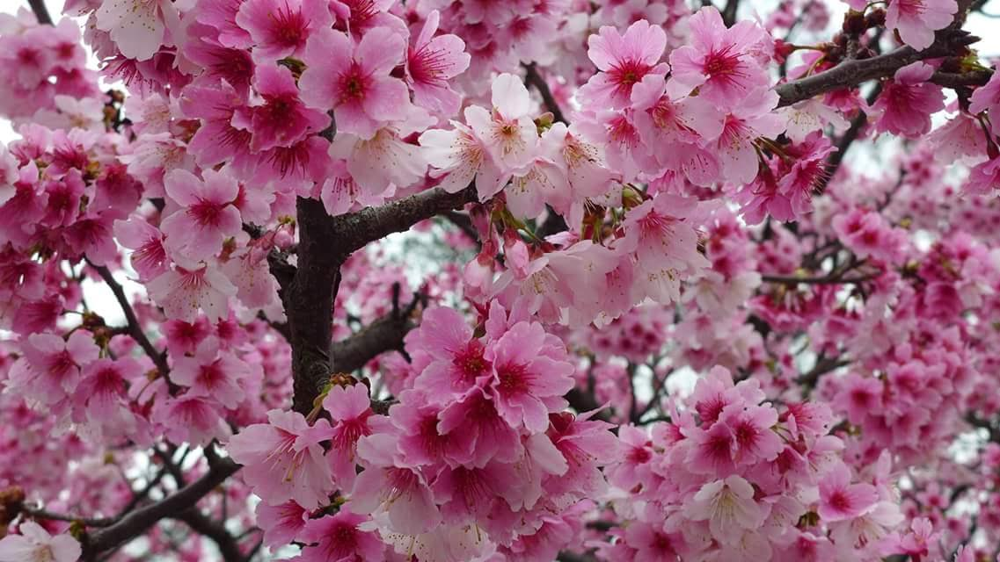

Height = 640,  Width = 1137


In [1]:
# Importing the OpenCV library
import cv2
from IPython.display import display
from PIL import Image

# Reading the image using imread() function
image = cv2.imread('sakura.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
display(Image.fromarray(image))

# Extracting the height and width of an image
h, w = image.shape[:2]
# Displaying the height and width
print("Height = {},  Width = {}".format(h, w))

# 2. Extracting the RGB values of a pixel



In [2]:

(B, G, R) = image[100, 100]

print("R = {}, G = {}, B = {}".format(R, G, B))

R = 126, G = 70, B = 175


# 3. Extracting the Region of Interest (ROI)

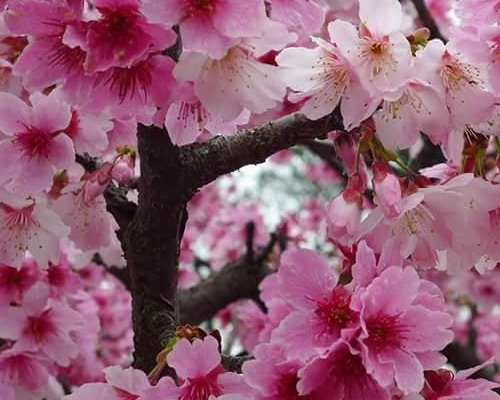

In [3]:
# We will calculate the region of interest
# by slicing the pixels of the image
roi = image[100 : 500, 200 : 700]


display(Image.fromarray(roi))

# 4. Resizing the Image

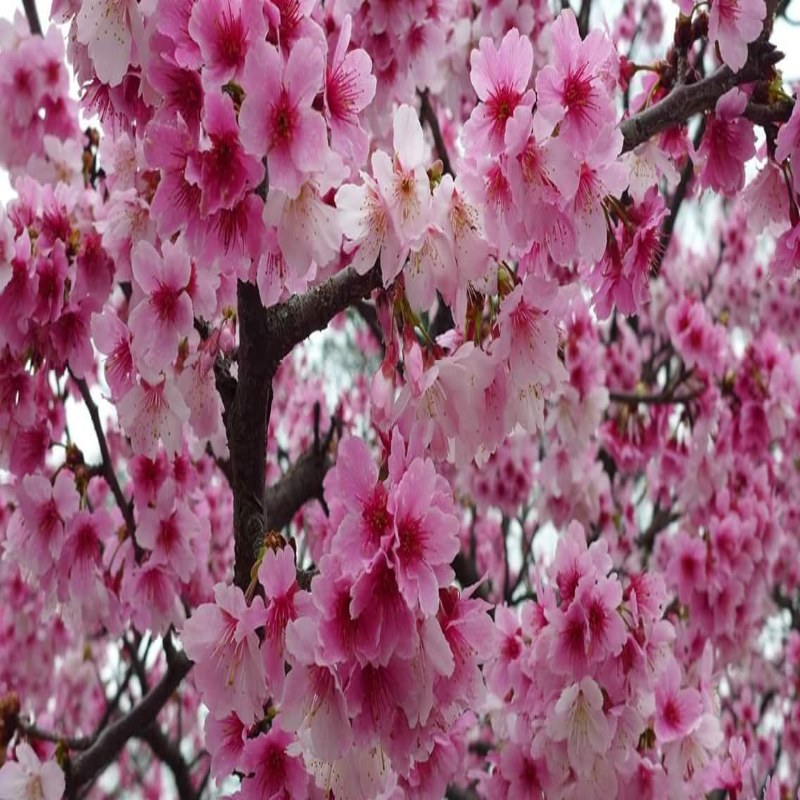

In [4]:
# resize() function takes 2 parameters,
# the image and the resolution
resize = cv2.resize(image, (800, 800))

display(Image.fromarray(resize))

# 5.Drawing a circle

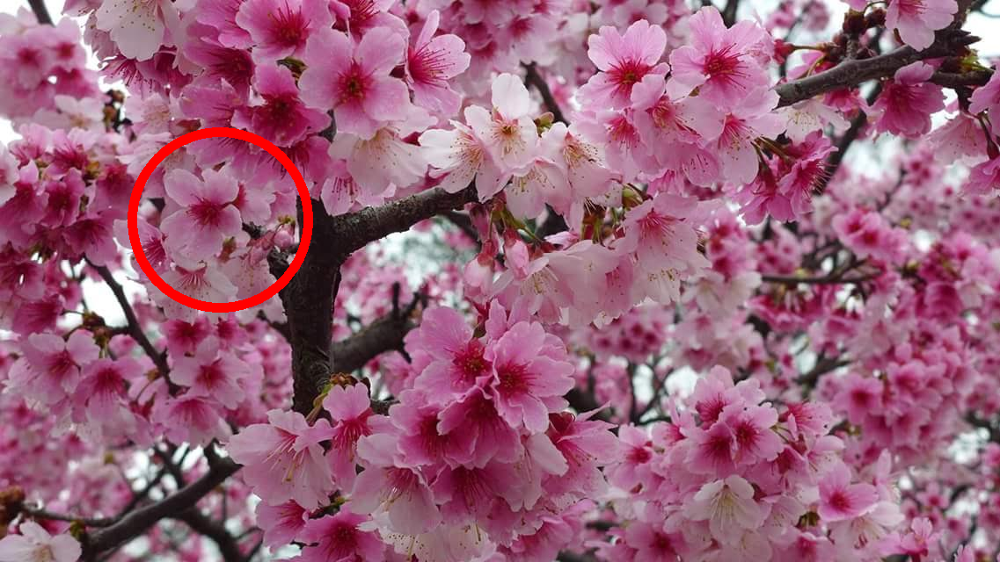

In [5]:
# Create an independent copy of the original image
image1 = image.copy()

cv2.circle(img=image1, center = (250,250), radius =100, color =(255,0,0), thickness=10)

display(Image.fromarray(image1))

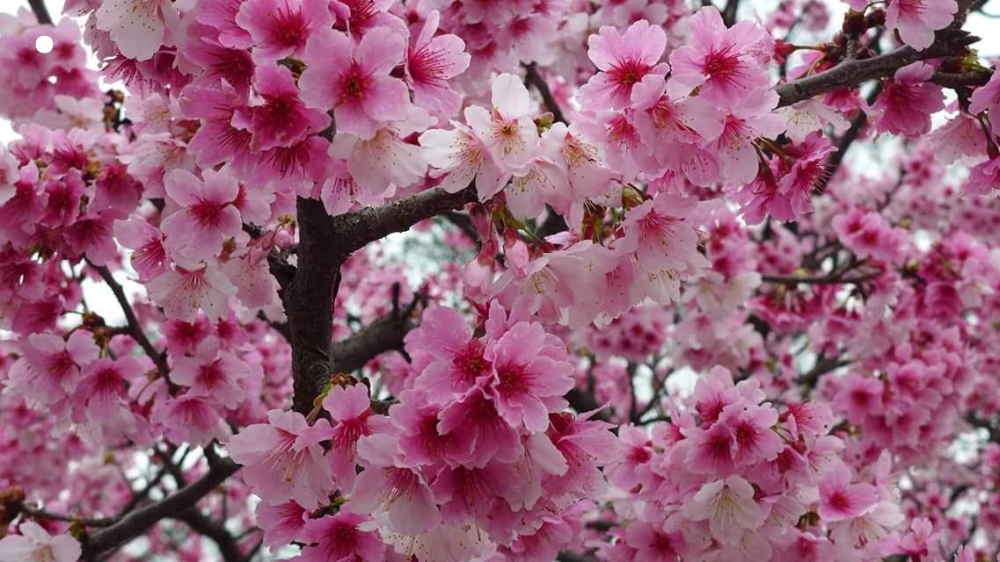

In [6]:
# Create another independent copy
image2 = image.copy()
cv2.circle(img=image2, center = (50,50), radius=10, color =(255,255,255), thickness=-1) #draw a filled circle
display(Image.fromarray(image2))

# 5.5 Drawing snowdrops

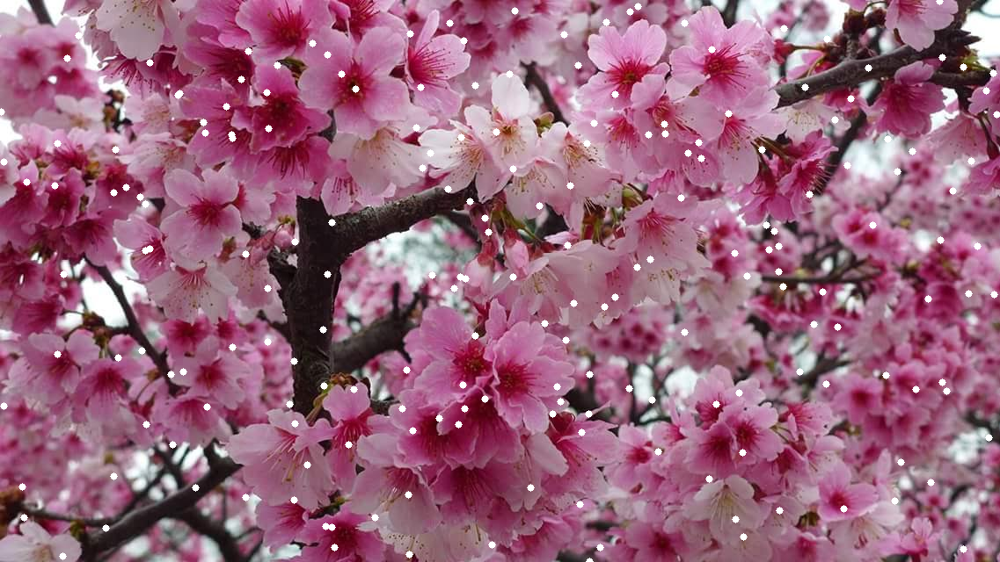

In [7]:
import numpy as np

image3 = image.copy()
for i in range(200):
    x = np.random.randint(0, w)
    y = np.random.randint(0, h)
    cv2.circle(img=image3, center = (x,y), radius=4, color =(255,255,255), thickness=-1) #draw a filled circle

display(Image.fromarray(image3))

# 6. Displaying text

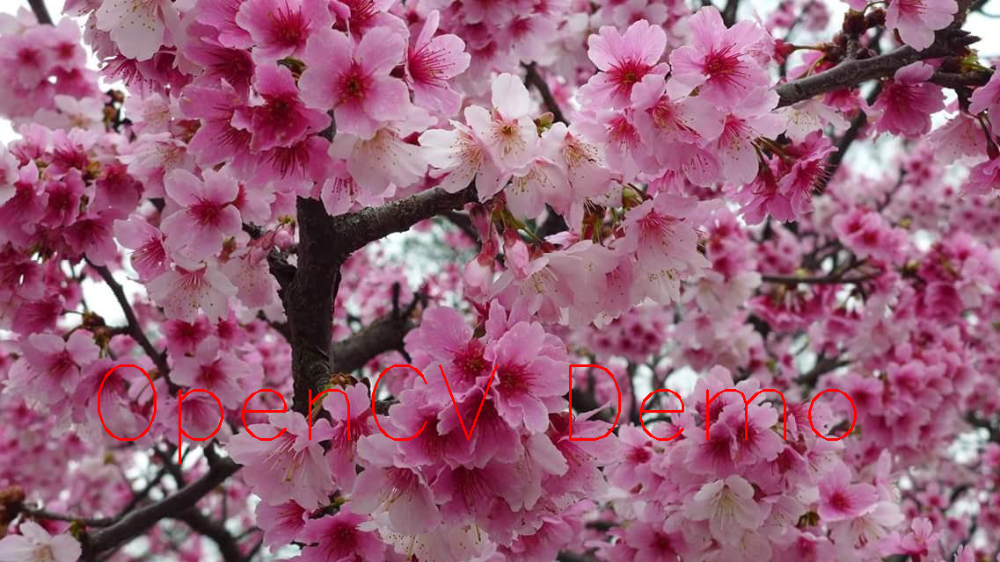

In [8]:
# Copying the original image
output = image.copy()

# Adding the text using putText() function
text = cv2.putText(output, 'OpenCV Demo', (100, 500),
cv2.FONT_HERSHEY_SIMPLEX, 4, (255, 0, 0), 2)

display(Image.fromarray(output))


# 7.Linear Transform

In [21]:
from __future__ import print_function
import cv2 
import numpy as np
# Read image given by user

image = cv2.imread('sakura.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

if image is None:
    print('Could not open or find the image: ', args.input)
    exit(0)
new_image = np.zeros(image.shape, image.dtype)
alpha = 1.0 # Simple contrast control
beta = 0    # Simple brightness control
# Window title
title_window = 'Brightness & Contrast Control'
cv2.namedWindow(title_window)
# Default values
alpha_init = 100  # represents 1.0
beta_init = 0

# Trackbar ranges
alpha_slider_max = 150   # corresponds to alpha = 3.0
beta_slider_max = 200    # corresponds to beta = 100

def apply_adjustments(alpha_val, beta_val):
    """Apply contrast and brightness adjustments."""
    alpha = alpha_val / 100.0  # scale alpha 0–3.0
    beta = beta_val - 100      # scale beta -100–100
    adjusted = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    cv2.imshow(title_window, cv2.cvtColor(adjusted, cv2.COLOR_RGB2BGR))

def on_trackbar_change(val):
    """Callback for any trackbar change."""
    alpha_val = cv2.getTrackbarPos('Alpha x100', title_window)
    beta_val = cv2.getTrackbarPos('Beta +/-100', title_window)
    apply_adjustments(alpha_val, beta_val)

# Create trackbars
cv2.createTrackbar('Alpha x100', title_window, alpha_init, alpha_slider_max, on_trackbar_change)
cv2.createTrackbar('Beta +/-100', title_window, beta_init + 100, beta_slider_max, on_trackbar_change)

# Initial display
apply_adjustments(alpha_init, beta_init + 100)

cv2.waitKey(0)
cv2.destroyAllWindows()

# 8.Blending two images !

In [ ]:
from __future__ import print_function, division
import cv2 
import argparse
alpha_slider_max = 100
title_window = 'Linear Blend'
def on_trackbar(val):
    alpha = val / alpha_slider_max
    beta = ( 1.0 - alpha )
    dst = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    cv2.imshow(title_window, dst)
# parser = argparse.ArgumentParser(description='Code for Adding a Trackbar to our applications tutorial.')
# parser.add_argument('--input1', help='Path to the first input image.', default='LinuxLogo.jpg')
# parser.add_argument('--input2', help='Path to the second input image.', default='WindowsLogo.jpg')
# args = parser.parse_args()
src1 = cv2.imread('LinuxLogo.jpg')
src2 = cv2.imread('WindowsLogo.jpg')
if src1 is None:
    # print('Could not open or find the image: ', args.input1)
    exit(0)
if src2 is None:
    # print('Could not open or find the image: ', args.input2)
    exit(0)
cv2.namedWindow(title_window)
trackbar_name = 'Alpha x %d' % alpha_slider_max
cv2.createTrackbar(trackbar_name, title_window , 0, alpha_slider_max, on_trackbar)
# Show some stuff
on_trackbar(0)
# Wait until user press some key
cv2.waitKey()
cv2.destroyAllWindows()